# Most exciting natural images

Edit `Cfg` below to select monkey/date/dataset/area/window, then run the notebook. The matching `natraster` and `ImageFolder` are loaded in the same order used for dRSA, and the images with the highest mean neural activity in the configured post-onset temporal window are displayed.


In [1]:
import os, re, socket, sys, yaml
from dataclasses import dataclass
from pathlib import Path

import h5py
import numpy as np
import matplotlib.pyplot as plt

import torch
from torch.utils.data import DataLoader, Subset
from torchvision.datasets import ImageFolder
from torchvision import transforms

PROJECT_ROOT = Path.cwd().resolve().parents[1] if Path.cwd().name == "scripts" else Path.cwd().resolve()
CONFIG_PATH = PROJECT_ROOT / "config.yaml"

with CONFIG_PATH.open("r") as f:
    config = yaml.safe_load(f)

ENV = os.getenv("MY_ENV")
paths = config[ENV]["paths"]
sys.path.append(paths["src_path"])
sys.path.append(paths["useful_stuff_path"])

from useful_stuff.general_utils import BrainAreas, TimeSeries, decode_matlab_strings
from useful_stuff.general_utils.RSA import dRSA
from project_specific_utils.dataloader import load_img_natraster, map_image_order_from_ann_to_monkey

In [18]:
@dataclass
class Cfg:
    monkey_name: str = "three0"
    date: str = "250313"
    folder_name: str = "talia_20each_tizi"
    brain_area: str = "V1"
    new_fs: int = 100
    window_start_ms: float = 60
    window_end_ms: float = 200
    top_k: int = 100
    batch_size: int = 16
    num_workers: int = 0

# Edit only this config block to select the data/session/window.
cfg = Cfg()
cfg


Cfg(monkey_name='three0', date='250313', folder_name='talia_20each_tizi', brain_area='V1', new_fs=100, window_start_ms=60, window_end_ms=200, top_k=100, batch_size=16, num_workers=0)

In [19]:
# Keep this loading/order-mapping sequence unchanged to avoid mixing up images.
area_rasters = load_img_natraster(paths, cfg.monkey_name, cfg.date, new_fs=cfg.new_fs, brain_area=cfg.brain_area)

dataset = ImageFolder(
    root=f"{paths['livingstone_lab']}/Stimuli/{cfg.folder_name}/",
    is_valid_file=lambda x: not x.endswith("Thumbs.db"),
    allow_empty=True,
)

# idx_ord maps monkey/raster stimulus order -> ImageFolder dataset indices.
# Example: idx_ord[7] is the dataset index for the 8th stimulus in monkey order.
idx_ord = np.asarray(map_image_order_from_ann_to_monkey(paths, cfg.monkey_name, cfg.date, dataset), dtype=int)


print("raster shape:", area_rasters.shape() if hasattr(area_rasters, "shape") else np.asarray(area_rasters).shape)
print("fs:", area_rasters.get_fs() if hasattr(area_rasters, "get_fs") else cfg.new_fs)
print("dataset images:", len(dataset), "ordered images:", len(idx_ord))


raster shape: (26, 30, 776)
fs: 100
dataset images: 776 ordered images: 776


In [20]:
def window_mean_activity(area_rasters, start_ms, end_ms):
    arr = area_rasters.get_array()
    fs = area_rasters.get_fs()

    # Convert the requested analysis window from milliseconds to sample indices.
    # Time is axis 1 because rasters are stored as (neurons, time, stimuli).
    start_idx = int(round(start_ms / 1000 * fs))
    end_idx = int(round(end_ms / 1000 * fs))
    if end_idx <= start_idx:
        raise ValueError("window_end_ms must be greater than window_start_ms")
    if arr.ndim != 3:
        raise ValueError(f"Expected a 3D raster array (neurons, time, stimuli), got shape {arr.shape}")
    if end_idx > arr.shape[1]:
        raise ValueError(f"Window ends at sample {end_idx}, but raster has only {arr.shape[1]} time bins")

    # Keep all neurons, keep only the requested time window, and keep all stimuli.
    # Averaging over axes (0, 1) collapses neurons and time, leaving one score per stimulus.
    return np.nanmean(arr[:, start_idx:end_idx, :], axis=(0, 1)), (start_idx, end_idx), fs

# excitement[i] is the mean response of stimulus i in monkey/raster order.
excitement, sample_window, fs = window_mean_activity(area_rasters, cfg.window_start_ms, cfg.window_end_ms)
if len(excitement) != len(idx_ord):
    raise ValueError(f"Raster has {len(excitement)} stimuli, but idx_ord has {len(idx_ord)} images")

# Rank stimuli by descending mean activity. These indices are still in monkey/raster order.
rank_in_monkey_order = np.argsort(excitement)[::-1][:cfg.top_k]
worse_in_monkey_order = np.argsort(excitement)[:cfg.top_k]

# Convert the selected monkey-order stimulus indices into ImageFolder dataset indices,
# so Subset(dataset, ...) loads the correct image files for display.
top_dataset_indices = idx_ord[rank_in_monkey_order]
bottom_dataset_indices = idx_ord[worse_in_monkey_order]

print(f"window samples: {sample_window[0]}:{sample_window[1]} at {fs} Hz")
print(f"selected images: {len(top_dataset_indices)} / requested top_k={cfg.top_k}")
print("top dataset indices:", top_dataset_indices.tolist())


window samples: 6:20 at 100 Hz
selected images: 100 / requested top_k=100
top dataset indices: [286, 597, 256, 335, 519, 322, 183, 497, 153, 716, 128, 772, 284, 609, 674, 285, 260, 602, 344, 374, 749, 154, 11, 706, 625, 520, 458, 647, 108, 259, 304, 567, 193, 704, 333, 299, 196, 703, 101, 254, 278, 698, 131, 230, 555, 28, 301, 295, 197, 96, 700, 222, 155, 624, 10, 356, 517, 306, 102, 106, 629, 25, 372, 291, 671, 728, 29, 521, 20, 213, 484, 690, 709, 445, 17, 103, 23, 522, 459, 670, 695, 120, 90, 595, 257, 542, 211, 699, 748, 310, 19, 305, 750, 516, 646, 146, 66, 632, 575, 119]


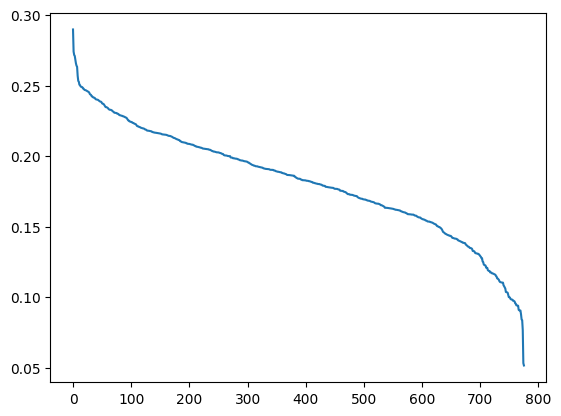

In [21]:
plt.plot(np.sort(excitement)[::-1])

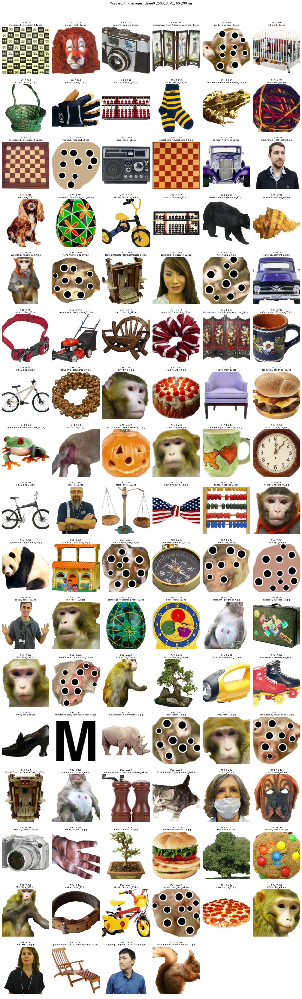

In [22]:
# Load the selected image files, preserving the ranked order above.
display_transform = transforms.Compose([transforms.Resize(256), transforms.CenterCrop(224), transforms.ToTensor()])
dataset.transform = display_transform
loader = DataLoader(Subset(dataset, top_dataset_indices.tolist()), batch_size=cfg.batch_size, shuffle=False, num_workers=cfg.num_workers)

images, labels = [], []
for batch_images, batch_labels in loader:
    images.extend(batch_images)
    labels.extend(batch_labels.tolist())

class_names = dataset.classes
# These metadata arrays follow the same descending-activity order as the displayed images.
ordered_names = [Path(dataset.samples[i][0]).name for i in top_dataset_indices]
ordered_scores = excitement[rank_in_monkey_order]

n_cols = min(6, max(1, cfg.top_k))
n_rows = int(np.ceil(len(images) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(2.7 * n_cols, 3.1 * n_rows), squeeze=False)
for ax in axes.ravel():
    ax.axis("off")

for rank, (ax, img, label, name, score) in enumerate(zip(axes.ravel(), images, labels, ordered_names, ordered_scores), start=1):
    ax.imshow(img.permute(1, 2, 0).numpy())
    ax.set_title(f"#{rank}  {score:.3g}\n{class_names[label]} / {name}", fontsize=8)
    ax.axis("off")

fig.suptitle(
    f"Most exciting images: {cfg.monkey_name} {cfg.date}, {cfg.brain_area}, "
    f"{cfg.window_start_ms:g}-{cfg.window_end_ms:g} ms",
    y=1.01,
)
fig.tight_layout()
plt.show()


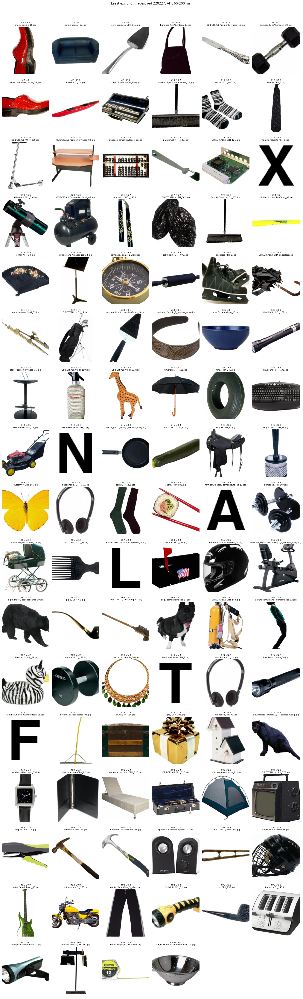

In [11]:
# Load the selected image files, preserving the ranked order above.
display_transform = transforms.Compose([transforms.Resize(256), transforms.CenterCrop(224), transforms.ToTensor()])
dataset.transform = display_transform
loader = DataLoader(Subset(dataset, bottom_dataset_indices.tolist()), batch_size=cfg.batch_size, shuffle=False, num_workers=cfg.num_workers)

images, labels = [], []
for batch_images, batch_labels in loader:
    images.extend(batch_images)
    labels.extend(batch_labels.tolist())

class_names = dataset.classes
# These metadata arrays follow the same descending-activity order as the displayed images.
ordered_names = [Path(dataset.samples[i][0]).name for i in top_dataset_indices]
ordered_scores = excitement[rank_in_monkey_order]

n_cols = min(6, max(1, cfg.top_k))
n_rows = int(np.ceil(len(images) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(2.7 * n_cols, 3.1 * n_rows), squeeze=False)
for ax in axes.ravel():
    ax.axis("off")

for rank, (ax, img, label, name, score) in enumerate(zip(axes.ravel(), images, labels, ordered_names, ordered_scores), start=1):
    ax.imshow(img.permute(1, 2, 0).numpy())
    ax.set_title(f"#{rank}  {score:.3g}\n{class_names[label]} / {name}", fontsize=8)
    ax.axis("off")

fig.suptitle(
    f"Least exciting images: {cfg.monkey_name} {cfg.date}, {cfg.brain_area}, "
    f"{cfg.window_start_ms:g}-{cfg.window_end_ms:g} ms",
    y=1.01,
)
fig.tight_layout()
plt.show()


In [12]:
# Table of the displayed images, in descending activity order.
try:
    import pandas as pd
    top_table = pd.DataFrame({
        "rank": np.arange(1, len(top_dataset_indices) + 1),
        "mean_activity": ordered_scores,
        "dataset_index": top_dataset_indices,
        "monkey_order_index": rank_in_monkey_order,
        "class": [class_names[label] for label in labels],
        "filename": ordered_names,
        "path": [dataset.samples[i][0] for i in top_dataset_indices],
    })
    with pd.option_context("display.max_rows", len(top_table), "display.max_colwidth", None):
        display(top_table)
except Exception:
    for rank, score, dataset_idx, monkey_idx, name in zip(range(1, len(top_dataset_indices) + 1), ordered_scores, top_dataset_indices, rank_in_monkey_order, ordered_names):
        print(rank, score, dataset_idx, monkey_idx, name)


1 43.903374 9043 9917 people_10.jpg
2 42.021603 9045 9919 people_12.jpg
3 41.967384 11557 5300 UFH_116.jpg
4 41.751503 12009 11819 zzAberdeen_17.jpg
5 40.773106 12043 11853 zzmonkeyfaces_18.jpg
6 40.688194 12010 11820 zzAberdeen_18.jpg
7 40.037006 12041 11851 zzmonkeyfaces_16.jpg
8 39.36964 5938 4516 FH_20.jpg
9 38.748978 11541 5284 UFH_100.jpg
10 38.7325 3324 9110 macaques_29.jpg
11 38.155853 11456 5199 UFH_015.jpg
12 37.834576 6067 4645 FH_7.jpg
13 37.61797 11529 5272 UFH_088.jpg
14 37.412945 12028 11838 zzmonkeyfaces_03.jpg
15 37.372 12031 11841 zzmonkeyfaces_06.jpg
16 37.294384 5865 4443 FH_132.jpg
17 37.140526 11567 5310 UFH_126.jpg
18 36.636353 6054 4632 FH_5.jpg
19 36.531776 5926 4504 FH_19.jpg
20 36.266045 12030 11840 zzmonkeyfaces_05.jpg
21 35.694008 11588 5331 UFH_147.jpg
22 35.22842 11503 5246 UFH_062.jpg
23 35.09666 5973 4551 FH_231.jpg
24 34.962654 12034 11844 zzmonkeyfaces_09.jpg
25 34.882317 5837 4415 FH_10.jpg
26 34.64556 8025 9093 macaques_12.jpg
27 34.569622 8314 7986